# 0.0 Weather prediccion Logistic Regression

### Librerias

In [1]:
### Import 
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import missingno as msno # To get visual representation of missing values
from plotly.subplots import make_subplots
import plotly.graph_objects as go


%matplotlib inline
import seaborn as sns
import missingno as msno # To get visual representation of missing values

import opendatasets as od


import math
import scipy.stats as stats
from scipy.stats import skew
import statsmodels.api as sm

import sklearn.compose 
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score



import warnings
warnings.filterwarnings('ignore') # To ignore the warnings

In [2]:
%matplotlib inline
sns.set_style(style='whitegrid')
sns.set_context(context ='notebook')
plt.rcParams['figure.figsize'] = (11, 9.4)

### Data description
1. *Date:*  The date of observation
2. *Location:* The common name of the location of the weather station
3. *MinTemp*: The minimum temperature in degrees celsius
4. *MaxTemp*: The maximum temperature in degrees celsius
5. *Rainfall*: The amount of rainfall recorded for the day in mm
6. *Evaporation*: The so-called Class A pan evaporation (mm) in the 24 hours to 9am
7. *Sunshine*: he number of hours of bright sunshine in the day.
8. *WindGustDir*: The direction of the strongest wind gust in the 24 hours to midnight
9. *WindGustSpeed*: The speed (km/h) of the strongest wind gust in the 24 hours to midnight
10. *WindDir9am*: Direction of the wind at 9am


### 1. Download dataset

In [3]:
df = pd.read_csv('../../data/interim/weather-dataset-rattle-package/weatherAUS.csv')
df.sample(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
120483,2017-01-22,PerthAirport,15.8,26.3,0.0,9.2,13.0,SW,52.0,S,...,56.0,37.0,1010.1,1010.5,1.0,1.0,21.9,24.8,No,No
37589,2011-12-27,WaggaWagga,14.3,27.6,3.6,5.0,12.8,NW,20.0,NW,...,78.0,38.0,1009.9,1008.2,5.0,2.0,18.3,26.0,Yes,No
134396,2012-09-26,Launceston,3.6,17.2,0.1,NaN,NaN,NNW,37.0,N,...,98.0,61.0,1020.0,1014.5,NaN,NaN,9.8,16.1,No,No
69111,2013-12-22,Melbourne,16.6,28.4,0.0,1.6,0.0,NNW,54.0,NE,...,87.0,57.0,1008.0,1005.4,NaN,NaN,18.9,26.0,No,Yes
2143,2015-01-11,Albury,18.4,30.6,12.6,NaN,NaN,NE,28.0,ESE,...,83.0,49.0,1012.5,1010.0,8.0,NaN,20.8,28.4,Yes,No


### 2. Colecta y validación de datos 

2.1. ¿Cuántas columnas y filas existen en el dataset?

In [4]:
print(f'There are {df.shape[0]} rows and {df.shape[1]} columns in the dataset')

There are 145460 rows and 23 columns in the dataset


2.2. ¿Cuáles son nuestras columnas? 

In [5]:
col_names = df.columns
col_names

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

2.3. ¿Qué tipo de datos tenemos en el dataset?

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

2.4. ¿Existen valores nulos explicitos en el conjunto de datos? 

In [7]:
(
    df
    .isnull()
    .any()
)

Date             False
Location         False
MinTemp           True
MaxTemp           True
Rainfall          True
Evaporation       True
Sunshine          True
WindGustDir       True
WindGustSpeed     True
WindDir9am        True
WindDir3pm        True
WindSpeed9am      True
WindSpeed3pm      True
Humidity9am       True
Humidity3pm       True
Pressure9am       True
Pressure3pm       True
Cloud9am          True
Cloud3pm          True
Temp9am           True
Temp3pm           True
RainToday         True
RainTomorrow      True
dtype: bool

2.5. De tener observaciones con valores nulos, ¿Cuántas tenemos por cada variable?

In [8]:
(
    df
    .isnull()
    .sum()
    .sort_values(ascending=False)
)

Sunshine         69835
Evaporation      62790
Cloud3pm         59358
Cloud9am         55888
Pressure9am      15065
Pressure3pm      15028
WindDir9am       10566
WindGustDir      10326
WindGustSpeed    10263
Humidity3pm       4507
WindDir3pm        4228
Temp3pm           3609
RainTomorrow      3267
Rainfall          3261
RainToday         3261
WindSpeed3pm      3062
Humidity9am       2654
Temp9am           1767
WindSpeed9am      1767
MinTemp           1485
MaxTemp           1261
Location             0
Date                 0
dtype: int64

2.6. ¿Cual es el porcentage de valores faltantes por columna?

In [9]:
(
    round(
        df
        .isnull()
        .sum() / df.shape[0] * 100,
        2
    )
)

Date              0.00
Location          0.00
MinTemp           1.02
MaxTemp           0.87
Rainfall          2.24
Evaporation      43.17
Sunshine         48.01
WindGustDir       7.10
WindGustSpeed     7.06
WindDir9am        7.26
WindDir3pm        2.91
WindSpeed9am      1.21
WindSpeed3pm      2.11
Humidity9am       1.82
Humidity3pm       3.10
Pressure9am      10.36
Pressure3pm      10.33
Cloud9am         38.42
Cloud3pm         40.81
Temp9am           1.21
Temp3pm           2.48
RainToday         2.24
RainTomorrow      2.25
dtype: float64

2.7. Visualización de valores faltantes. 

<Axes: >

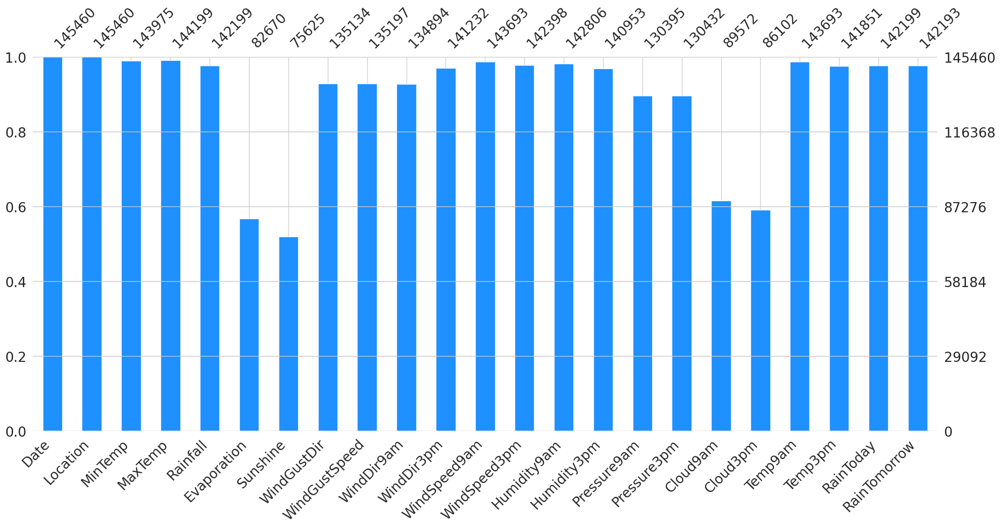

In [10]:
msno.bar(df, color='dodgerblue', fontsize=20, labels=True)

2.8 ¿Cuántas variables de cada tipo de datos tenemos en el conjunto de datos?

In [11]:
(
    df
    .dtypes
    .value_counts()
)

float64    16
object      7
Name: count, dtype: int64

### 3. Analisis de variables categóricas

3.1 Guardamos las variables categoricas en una sola variable

In [12]:
categorical = df.select_dtypes(include = ['object']).columns
categorical

Index(['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'RainToday', 'RainTomorrow'],
      dtype='object')

In [13]:
df[categorical].sample(5)

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
121701,2011-06-29,Perth,NE,NE,NaN,Yes,Yes
39876,2009-12-05,Williamtown,SE,S,SE,No,No
104870,2015-08-04,Nuriootpa,W,W,W,Yes,Yes
12746,2010-11-11,Moree,NaN,NNE,SSE,No,No
127180,2009-12-15,Walpole,SSW,SW,SW,No,No


**Summary of categorical variable**

- There is a date variable. It is denoted by `Date` column.
- There are 6 categorical variables. These are given by `Location`, `WindGustDir`, `WindDir9am`, `WindDir3pm`, `RainToday` and `RainTomorrow`.
- There are two binary categorical variables - `RainToday` and `RainTomorrow`.
- `RainTomorrow` is the *target variable*.

3.2. Valores faltantes en categorical values

In [14]:
df[categorical].isnull().sum()

Date                0
Location            0
WindGustDir     10326
WindDir9am      10566
WindDir3pm       4228
RainToday        3261
RainTomorrow     3267
dtype: int64

In [15]:
# Print categorical variables containing missing values

categorical_missing = [var for var in categorical if df[var].isnull().sum() > 0]

print(df[categorical_missing].isnull().sum())

WindGustDir     10326
WindDir9am      10566
WindDir3pm       4228
RainToday        3261
RainTomorrow     3267
dtype: int64


3.3 Grafico de categorical missing values

<Axes: >

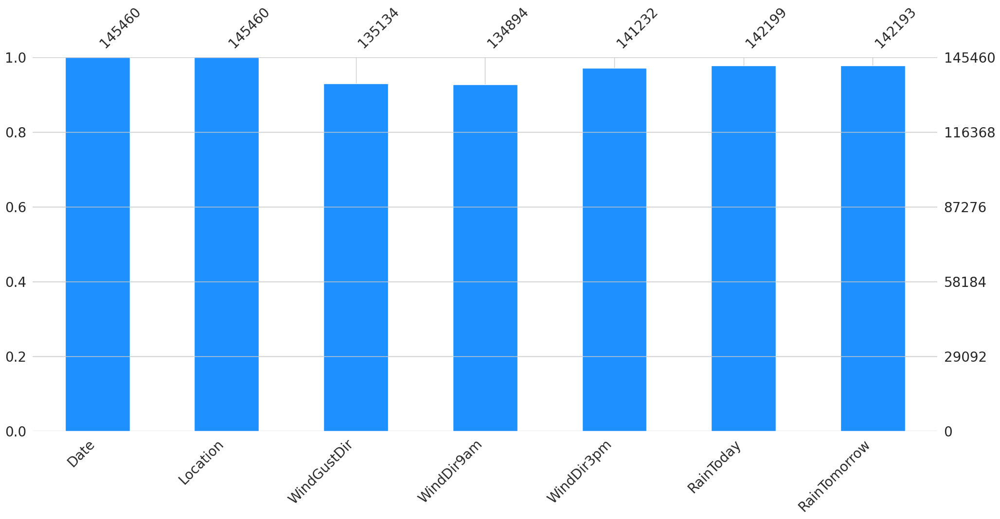

In [16]:
msno.bar(df[categorical], color='dodgerblue', fontsize=20, labels=True)

3.4 Contador de frecuencias en categorical values

In [17]:
for column in categorical:
    print(df[column].value_counts())
    print('****'*40)

Date
2013-11-12    49
2014-09-01    49
2014-08-23    49
2014-08-24    49
2014-08-25    49
              ..
2007-11-29     1
2007-11-28     1
2007-11-27     1
2007-11-26     1
2008-01-31     1
Name: count, Length: 3436, dtype: int64
****************************************************************************************************************************************************************
Location
Canberra            3436
Sydney              3344
Darwin              3193
Melbourne           3193
Brisbane            3193
Adelaide            3193
Perth               3193
Hobart              3193
Albany              3040
MountGambier        3040
Ballarat            3040
Townsville          3040
GoldCoast           3040
Cairns              3040
Launceston          3040
AliceSprings        3040
Bendigo             3040
Albury              3040
MountGinini         3040
Wollongong          3040
Newcastle           3039
Tuggeranong         3039
Penrith             3039
Woomera             300

3.5. Numero de capas: Cardinaliad (Cardinality)

The number of labels within a categorical variable is known as cardinality. A high number of labels within a variable is known as high cardinality. High cardinality may pose some serious problems in the machine learning model. So, I will check for high cardinality.



In [18]:
for column in categorical:
   print(f'{column} contains: {len(df[column].unique())} labels')

Date contains: 3436 labels
Location contains: 49 labels
WindGustDir contains: 17 labels
WindDir9am contains: 17 labels
WindDir3pm contains: 17 labels
RainToday contains: 3 labels
RainTomorrow contains: 3 labels


3.6 Tratamiento de valores faltantes 

3.6.1 tratamiento en Categorical missing values

In [19]:
categorical = df.select_dtypes(include = ['object']).columns


In [20]:
df[categorical]

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,W,W,WNW,No,No
1,2008-12-02,Albury,WNW,NNW,WSW,No,No
2,2008-12-03,Albury,WSW,W,WSW,No,No
3,2008-12-04,Albury,NE,SE,E,No,No
4,2008-12-05,Albury,W,ENE,NW,No,No
...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,E,SE,ENE,No,No
145456,2017-06-22,Uluru,NNW,SE,N,No,No
145457,2017-06-23,Uluru,N,SE,WNW,No,No
145458,2017-06-24,Uluru,SE,SSE,N,No,No


In [21]:
df['WindGustDir'].fillna(df['WindGustDir'].mode()[0], inplace=True)
df['WindDir9am'].fillna(df['WindDir9am'].mode()[0], inplace=True)
df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0], inplace=True)
df['RainToday'].fillna(df['RainToday'].mode()[0], inplace=True)
df['RainTomorrow'].fillna(df['RainTomorrow'].mode()[0], inplace=True)

In [22]:
df[categorical].isnull().sum()

Date            0
Location        0
WindGustDir     0
WindDir9am      0
WindDir3pm      0
RainToday       0
RainTomorrow    0
dtype: int64

3.6.2 Tratamiento de missing numeric values

In [23]:
numeric = df.select_dtypes(include = np.number).columns
numeric

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')

In [24]:
df[numeric].isnull().sum()

MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustSpeed    10263
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
dtype: int64

In [25]:
for column in numeric:
    df[column].fillna(df[column].median(), inplace=True)

In [26]:
df[numeric].isnull().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

### 4. EDA

In [27]:
df[numeric].corr()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
MinTemp,1.000000,0.733358,0.102339,0.364798,0.032632,0.171899,0.173513,0.173055,-0.231310,0.006111,-0.423299,-0.432824,0.043056,0.000157,0.897829,0.698574
MaxTemp,0.733358,1.000000,-0.073563,0.447289,0.315487,0.066451,0.014389,0.049507,-0.498350,-0.498725,-0.308057,-0.396339,-0.232311,-0.218368,0.879335,0.968332
Rainfall,0.102339,-0.073563,1.000000,-0.041371,-0.168777,0.125109,0.084586,0.055688,0.220661,0.247946,-0.158812,-0.119397,0.164202,0.139380,0.010933,-0.077466
Evaporation,0.364798,0.447289,-0.041371,1.000000,0.279210,0.149942,0.148681,0.101264,-0.384284,-0.293638,-0.213660,-0.233593,-0.169494,-0.160652,0.425712,0.434014
Sunshine,0.032632,0.315487,-0.168777,0.279210,1.000000,-0.031229,-0.012197,0.023176,-0.330031,-0.430357,0.035759,-0.010618,-0.505488,-0.526045,0.191385,0.331676
WindGustSpeed,0.171899,0.066451,0.125109,0.149942,-0.031229,1.000000,0.578744,0.657975,-0.208803,-0.026804,-0.425819,-0.384140,0.046261,0.072894,0.145717,0.032375
WindSpeed9am,0.173513,0.014389,0.084586,0.148681,-0.012197,0.578744,1.000000,0.512279,-0.268196,-0.031079,-0.215107,-0.165124,0.006593,0.028376,0.127491,0.004806
WindSpeed3pm,0.173055,0.049507,0.055688,0.101264,0.023176,0.657975,0.512279,1.000000,-0.143358,0.016275,-0.277277,-0.239274,0.031498,0.010460,0.161040,0.027529
Humidity9am,-0.231310,-0.498350,0.220661,-0.384284,-0.330031,-0.208803,-0.268196,-0.143358,1.000000,0.659290,0.131418,0.175914,0.355815,0.278105,-0.469774,-0.491242
Humidity3pm,0.006111,-0.498725,0.247946,-0.293638,-0.430357,-0.026804,-0.031079,0.016275,0.659290,1.000000,-0.025986,0.048527,0.396914,0.403456,-0.216951,-0.555606


<Axes: >

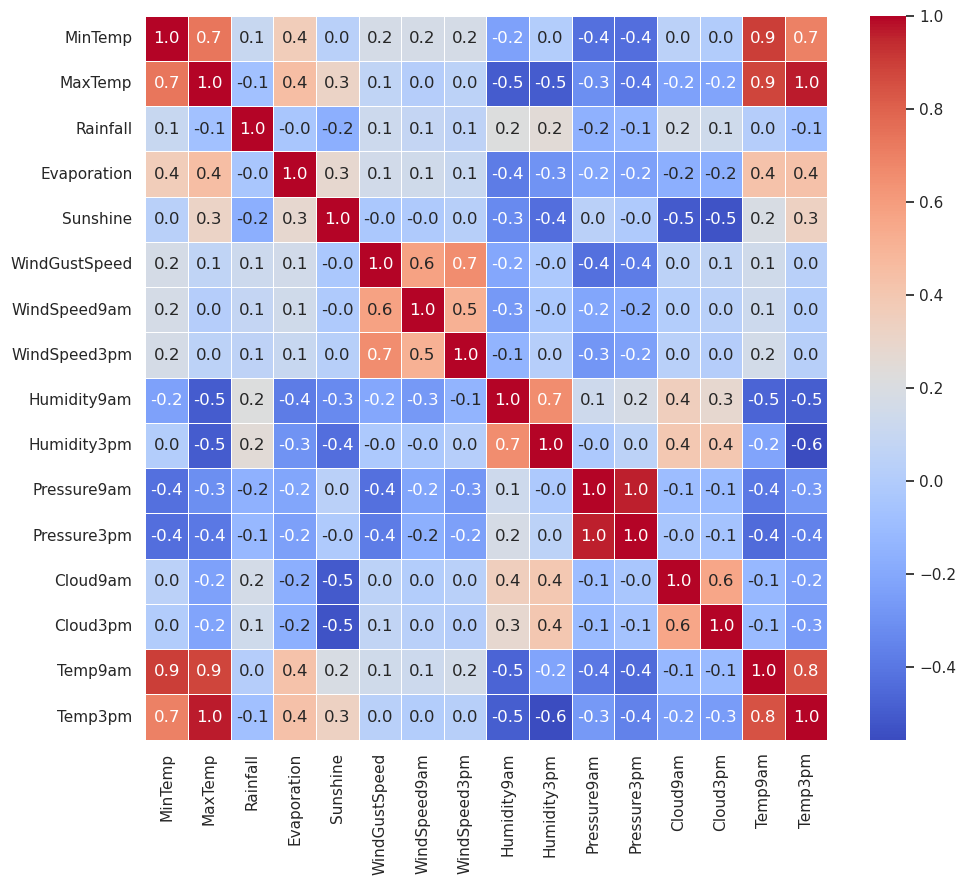

In [28]:
sns.heatmap(
    df[numeric].corr(),
     annot=True, 
     cmap='coolwarm', 
     linewidths=0.5, 
     fmt='.1f'
)

**Observaciones**
- Variables `Temp` `presure` y `Humidity` tienen correlacion fuertes entre si.
- `Rainfall` tiene una correlacion débil con el resto de variables.

4.1 Analisis univariado numerico

In [29]:
df[numeric].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000
mean,12.192053,23.215962,2.307990,5.179779,7.989889,39.962189,14.030751,18.669758,68.901251,51.553396,1017.644768,1015.250115,4.659755,4.709913,16.987101,21.668916
std,6.365780,7.088358,8.389771,3.178819,2.757790,13.120931,8.861796,8.716716,18.855360,20.471345,6.728484,6.663994,2.281490,2.106768,6.449299,6.850658
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000
25%,7.700000,18.000000,0.000000,4.000000,8.200000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.500000,1011.100000,3.000000,4.000000,12.300000,16.700000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000
75%,16.800000,28.200000,0.600000,5.200000,8.700000,46.000000,19.000000,24.000000,83.000000,65.000000,1021.800000,1019.400000,6.000000,6.000000,21.500000,26.200000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000


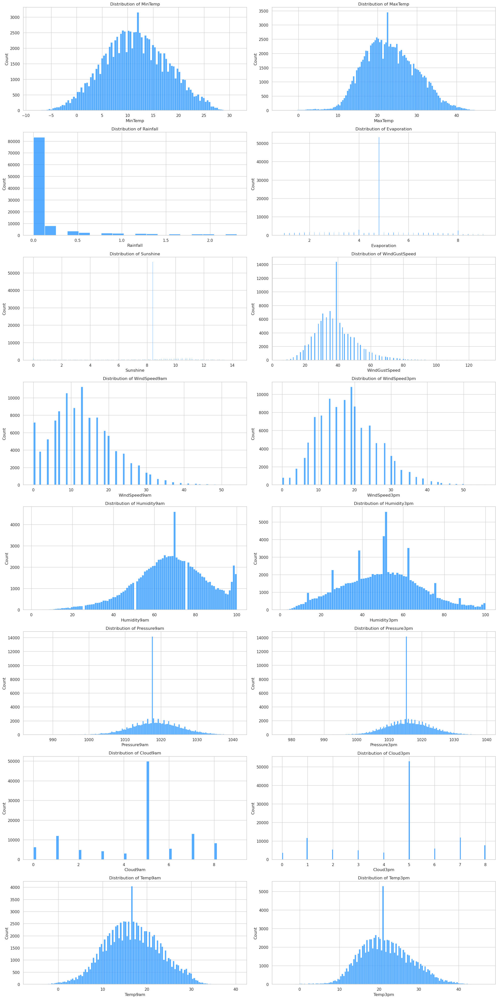

In [80]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go


columns = df[numeric].columns.tolist()

fig, ax = plt.subplots(8, 2, figsize=(20, 40))

ax = ax.flatten()

for i, column in enumerate(columns):
    sns.histplot(
        df[column], 
        ax=ax[i], 
        color='dodgerblue'
    )
    ax[i].set_title(f'Distribution of {column}')

fig.tight_layout()


# fig = make_subplots(
#     rows=8, cols=2, 
#     subplot_titles=columns
# )

# # Add histograms to each subplot
# for i, column in enumerate(columns):
#     row = (i // 2) + 1  # Calculate row index (1-based)
#     col = (i % 2) + 1   # Calculate column index (1-based)
#     fig.add_trace(go.Histogram(x=df[column], name=column), row=row, col=col)

# # Update layout
# fig.update_layout(
#     height=2000, 
#     width=1300, 
#     title_text="Distribution of Various Weather Metrics"
# )

# # Show the figure
# fig.show()


**Observaciones**
- `Rainfall`, `Evaporation`, `WindGustSpeed`, `WindSpeed9am`, `WindSpeed3pm`, `Cloud9am ` y `Cloud3pm` estas variables poseen sesgos hacia la derecha. 
- Se observa outliers en las siguientes columnas `Rainfall`, `Evaporation`, `WindSpeed9am` y `WindSpeed3pm `

4.2 Visualizacion de los outliers

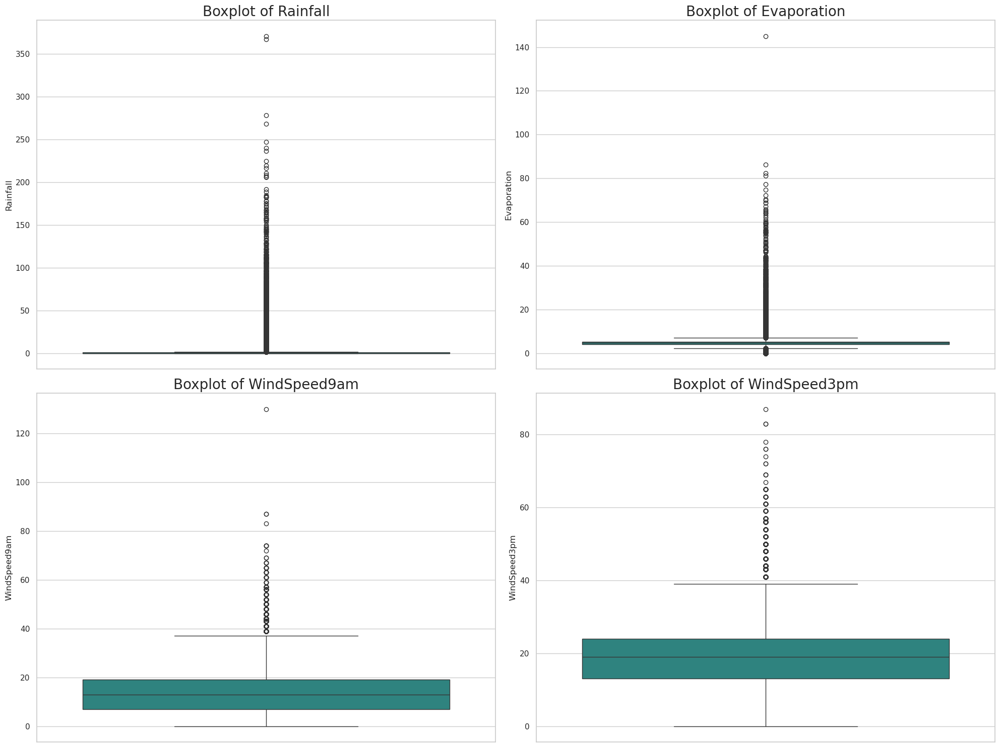

In [31]:
outliers = ['Rainfall', 'Evaporation', 'WindSpeed9am','WindSpeed3pm']

fig, ax = plt.subplots(2, 2, figsize=(20, 15))
ax = ax.flatten()

for i, variable in enumerate(outliers):
    sns.boxplot(
        data=df, 
        y=variable, 
        ax=ax[i], 
        palette='viridis')
    ax[i].set_title(f'Boxplot of {variable}', fontsize=20)

plt.tight_layout()

4.3 Método IQR para outliers 

In [32]:
# find outliers for Rainfall

for i in outliers:
    IQR = df[i].quantile(0.75) - df[i].quantile(0.25)
    lower_bound = df[i].quantile(0.25) - (IQR * 3)
    upper_bound = df[i].quantile(0.75) + (IQR * 3)
    print(f'\n{i} outliers are below {lower_bound} and above {upper_bound}')




Rainfall outliers are below -1.7999999999999998 and above 2.4

Evaporation outliers are below 0.39999999999999947 and above 8.8

WindSpeed9am outliers are below -29.0 and above 55.0

WindSpeed3pm outliers are below -20.0 and above 57.0


4.4 Eliminamos los outliers

In [33]:
# drop outliers for each variable
for i in outliers:
    IQR = df[i].quantile(0.75) - df[i].quantile(0.25)
    lower_bound = df[i].quantile(0.25) - (IQR * 3)
    upper_bound = df[i].quantile(0.75) + (IQR * 3)
    df = df[(df[i] > lower_bound) & (df[i] < upper_bound)]

4.5 Visualizacion de variables categoricas

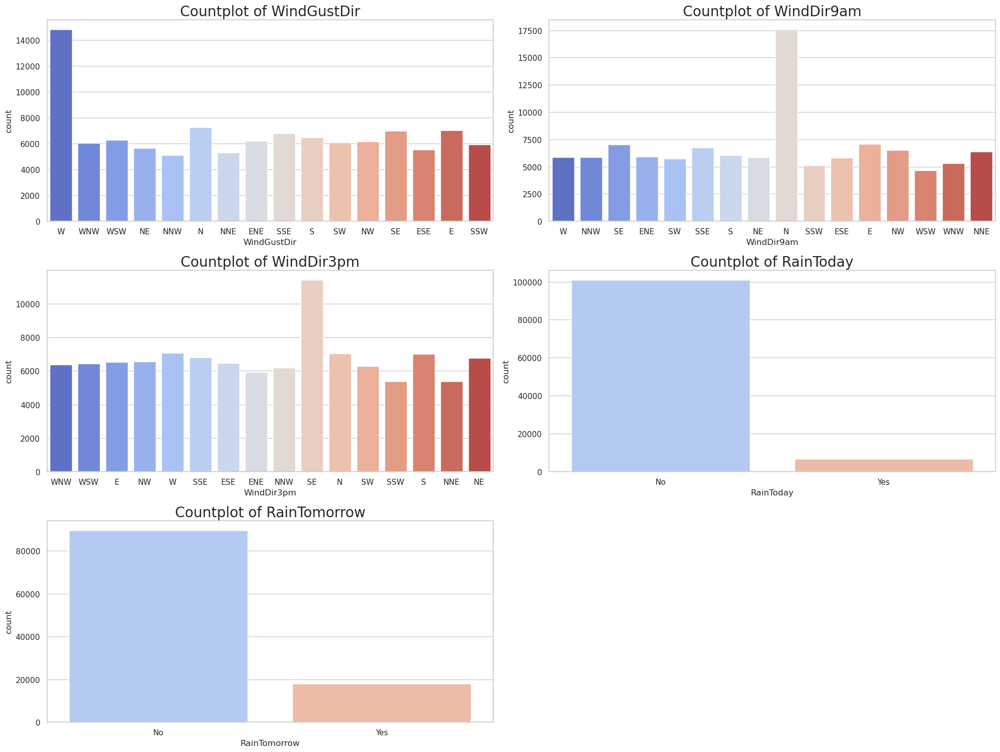

In [86]:
categorical = df.select_dtypes(include = ['object']).columns
categorical = categorical.to_list()
columns = categorical[1:]

fig, ax = plt.subplots(3, 2, figsize=(20, 15))

ax = ax.flatten()

for i, column in enumerate(columns):
    sns.countplot(
        data=df, 
        x=column, 
        ax=ax[i], 
        palette='coolwarm')
    ax[i].set_title(f'Countplot of {column}', fontsize=20)

plt.tight_layout()

for j in range(len(columns), len(ax)):
    ax[j].axis('off')
# columns = df[categorical][1:].columns.tolist()
# columns

# fig = make_subplots(
#     rows=3, cols=2, 
#     subplot_titles=columns
# )

# # Add histograms to each subplot
# for i, column in enumerate(columns):
#     row = (i // 2) + 1  # Calculate row index (1-based)
#     col = (i % 2) + 1   # Calculate column index (1-based)
#     fig.add_trace(go.Histogram(x=df[column], name=column), row=row, col=col)

# # Update layout
# fig.update_layout(
#     height=1000, 
#     width=1300, 
#     title_text="Distribution of Various Weather Metrics"
# )

# # Show the figure
# fig.show()


4.6 Preprocesamos la variable `Date`

Vemos que la variable `Date` necesita ser preprocesado. El resto de variables categoricales esta bien.

In [35]:
df.Date.dtypes

dtype('O')

La variable date es _Object_. convertimos a datetime format. 

In [36]:
df.Date = pd.to_datetime(df.Date)


Extraeremos en cada columna, el mes, el dia y el año y posteriormente eliminaremos la columna `Date`

In [37]:
df['Year'] = df.Date.dt.year
df['Month'] = df.Date.dt.month
df['Day'] = df.Date.dt.day

df.drop('Date', axis=1, inplace=True)

df.sample(5)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
127951,Walpole,13.7,22.5,1.0,4.8,8.4,SE,35.0,NE,SSE,...,1016.6,5.0,5.0,17.1,20.3,No,No,2012,2,27
143907,Uluru,19.6,38.0,0.0,4.8,8.4,N,46.0,ENE,N,...,1004.5,5.0,5.0,28.4,36.7,No,No,2013,3,26
5674,BadgerysCreek,2.9,20.4,0.0,4.8,8.4,NW,24.0,N,NNE,...,1019.1,5.0,5.0,8.1,20.3,No,No,2016,6,16
103657,Nuriootpa,10.3,21.8,0.0,6.4,4.6,S,35.0,ESE,SW,...,1013.2,6.0,7.0,15.3,20.0,No,No,2012,2,9
129053,Walpole,9.0,16.2,0.0,4.8,8.4,SSW,61.0,WNW,NW,...,1005.9,5.0,5.0,14.4,14.5,No,Yes,2015,5,3


In [38]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Year,Month,Day
count,107511.000000,107511.000000,107511.000000,107511.000000,107511.00000,107511.000000,107511.000000,107511.000000,107511.000000,107511.000000,107511.000000,107511.000000,107511.000000,107511.000000,107511.000000,107511.000000,107511.000000,107511.000000,107511.000000
mean,11.555145,23.242190,0.172028,4.737680,8.17956,38.642716,13.246412,18.246086,67.739859,49.682544,1018.485888,1015.878124,4.544940,4.611705,16.708595,21.720376,2012.805704,6.417008,15.702486
std,6.257947,6.637734,0.433012,1.585087,2.46593,12.414626,8.453018,8.452566,17.387206,18.851117,6.389095,6.395527,2.210465,2.051613,6.195152,6.402922,2.537122,3.353073,8.786042
min,-8.500000,-4.100000,0.000000,0.900000,0.00000,6.000000,0.000000,0.000000,1.000000,1.000000,984.600000,977.100000,0.000000,0.000000,-5.600000,-4.400000,2007.000000,1.000000,1.000000
25%,7.100000,18.500000,0.000000,4.400000,8.40000,31.000000,7.000000,13.000000,57.000000,36.000000,1014.800000,1012.000000,3.000000,4.000000,12.400000,17.200000,2011.000000,4.000000,8.000000
50%,11.500000,22.700000,0.000000,4.800000,8.40000,39.000000,13.000000,17.000000,69.000000,51.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000,2013.000000,6.000000,16.000000
75%,15.900000,27.800000,0.000000,4.800000,8.70000,44.000000,19.000000,24.000000,80.000000,62.000000,1022.500000,1019.900000,6.000000,5.000000,21.000000,25.900000,2015.000000,9.000000,23.000000
max,31.400000,47.300000,2.300000,9.100000,14.30000,130.000000,54.000000,56.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,8.000000,40.200000,46.700000,2017.000000,12.000000,31.000000


4.7 análisis bivariado

In [39]:
#sns.pairplot(df.select_dtypes(np.number) , hue='RainToday')

In [40]:
px.scatter(df, 
           title='Min Temp. vs Max Temp.',
           x='MinTemp', 
           y='MaxTemp', 
           color='RainToday')

In [41]:
px.scatter(df, 
           title='Humidity 9am vs Humidity 3pm',
           x='Humidity9am',
           y='Humidity3pm',
           color='RainToday')

In [42]:
px.scatter(df, 
           title='Temp (3 pm) vs. Humidity (3 pm)',
           x='Temp3pm',
           y='Humidity3pm',
           color='RainToday')

### Training, Validation & Test sets 

In [43]:
X_input = df.drop('RainTomorrow', axis=1)
y_target = df['RainTomorrow']


In [44]:
X_train, X_rest, y_train, y_rest = train_test_split(
    X_input, y_target, 
    test_size=0.4, 
    random_state=42
)

X_val, X_test, y_val, y_test = train_test_split(
    X_rest, y_rest, 
    test_size=0.5, 
    random_state=42
)

print(f'Training set: {X_train.shape} samples')
print(f'Validation set: {X_val.shape} samples')
print(f'Test set: {X_test.shape} samples')


Training set: (64506, 24) samples
Validation set: (21502, 24) samples
Test set: (21503, 24) samples


However, while working with dates, it's often a better idea to separate the training, validation and test sets with time, so that the model is trained on data from the past and evaluated on data from the future.

For the current dataset, we can use the Date column in the dataset to create another column for year. We'll pick the last two years for the test set, and one year before it for the validation set.

<Axes: title={'center': 'No. of Rows per Year'}, xlabel='Year', ylabel='count'>

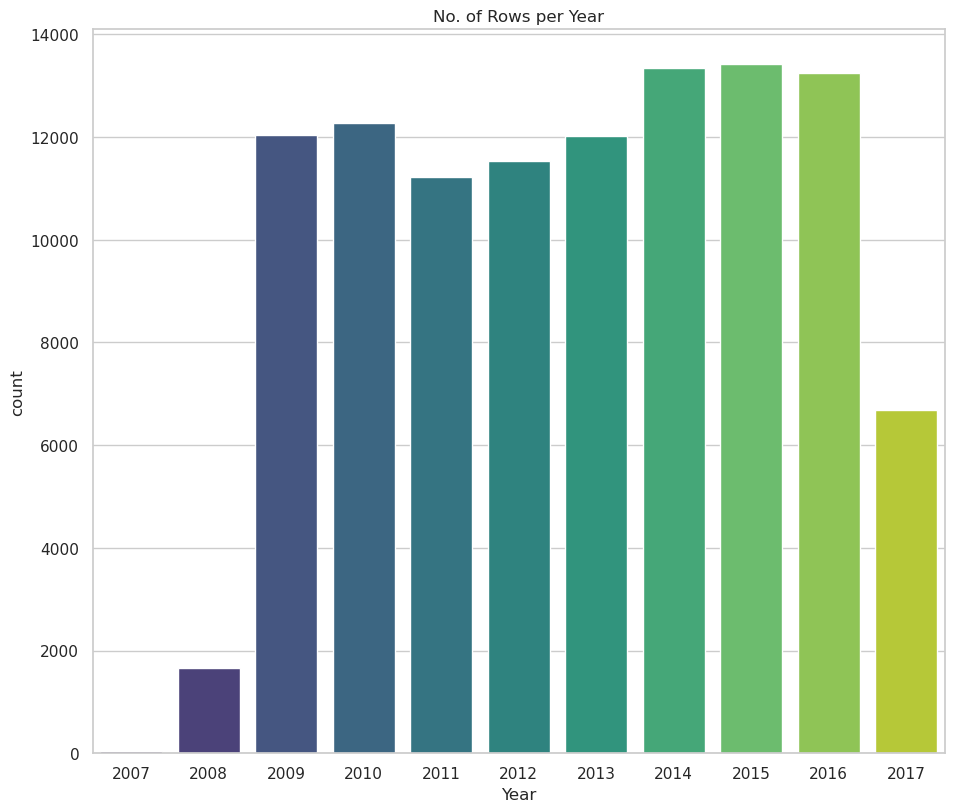

In [45]:
plt.title('No. of Rows per Year')
sns.countplot(data=df, x='Year', palette='viridis')

In [46]:
train_df  = df[df['Year'] < 2015]
val_df  = df[df['Year'] == 2015]
test_df  = df[df['Year'] > 2015]

print(f'Training set: {train_df.shape} samples')
print(f'Validation set: {val_df.shape} samples')
print(f'Test set: {test_df.shape} samples')

Training set: (74150, 25) samples
Validation set: (13425, 25) samples
Test set: (19936, 25) samples


In [47]:
train_df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.9,0.6,4.8,8.4,W,44.0,W,WNW,...,1007.1,8.0,5.0,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,4.8,8.4,WNW,44.0,NNW,WSW,...,1007.8,5.0,5.0,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,4.8,8.4,WSW,46.0,W,WSW,...,1008.7,5.0,2.0,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,4.8,8.4,NE,24.0,SE,E,...,1012.8,5.0,5.0,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,4.8,8.4,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144548,Uluru,16.9,33.2,0.0,4.8,8.4,SSE,43.0,ESE,SSE,...,1009.8,5.0,5.0,23.7,31.8,No,No,2014,12,27
144549,Uluru,15.1,36.8,0.0,4.8,8.4,NE,31.0,ENE,SW,...,1007.6,5.0,5.0,28.9,34.8,No,No,2014,12,28
144550,Uluru,17.3,37.8,0.0,4.8,8.4,ESE,39.0,ESE,SSE,...,1008.0,5.0,5.0,29.7,35.7,No,No,2014,12,29
144551,Uluru,20.1,38.5,0.0,4.8,8.4,ESE,43.0,ESE,SSW,...,1009.2,5.0,5.0,29.8,37.2,No,No,2014,12,30


### Identifying Input and Target Columns
Often, not all the columns in a dataset are useful for training a model. In the current dataset, we can ignore the Date column, since we only want to weather conditions to make a prediction about whether it will rain the next day.

Let's create a list of input columns, and also identify the target column.

In [48]:
input_col = list(df.drop(['RainTomorrow','Year', 'Day'], axis=1))
target_col = 'RainTomorrow'
print(input_col)


['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'Month']


In [49]:
train_inputs = train_df[input_col].copy()
train_target = train_df[target_col].copy()

val_inputs = val_df[input_col].copy()
val_target = val_df[target_col].copy()

test_inputs = test_df[input_col].copy()
test_target = test_df[target_col].copy()


In [50]:
test_target

2498       No
2499      Yes
2500      Yes
2503       No
2504       No
         ... 
145455     No
145456     No
145457     No
145458     No
145459     No
Name: RainTomorrow, Length: 19936, dtype: object

## Scaling Numeric Features

Another good practice is to scale numeric features to a small range of values e.g. $(0,1)$ or $(-1,1)$. Scaling numeric features ensures that no particular feature has a disproportionate impact on the model's loss. Optimization algorithms also work better in practice with smaller numbers.

The numeric columns in our dataset have varying ranges.

In [51]:
numeric_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()
categorical_cols = train_inputs.select_dtypes('object').columns.tolist()

In [52]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

In [53]:
scaler.fit(df[numeric_cols])

MinMaxScaler()

In [54]:
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])


In [55]:
train_inputs[numeric_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Month
count,74150.000000,74150.000000,74150.000000,74150.000000,74150.000000,74150.000000,74150.000000,74150.000000,74150.000000,74150.000000,74150.000000,74150.000000,74150.000000,74150.000000,74150.000000,74150.000000,74150.000000
mean,0.497491,0.527014,0.075083,0.462611,0.569919,0.264945,0.246475,0.328190,0.672350,0.491937,0.598853,0.618854,0.493191,0.566022,0.483242,0.507597,0.511813
std,0.155094,0.125930,0.188299,0.202017,0.183601,0.100480,0.158070,0.152591,0.173624,0.190371,0.112694,0.101699,0.249065,0.261758,0.132659,0.123328,0.303191
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.021277,0.049600,0.000000,0.000000,0.008734,0.000000,0.000000
25%,0.388471,0.435798,0.000000,0.378049,0.587413,0.201613,0.129630,0.232143,0.565657,0.353535,0.533688,0.556800,0.333333,0.375000,0.390830,0.420744,0.272727
50%,0.496241,0.519455,0.000000,0.475610,0.587413,0.266129,0.240741,0.339286,0.676768,0.494949,0.585106,0.609600,0.555556,0.625000,0.482533,0.499022,0.545455
75%,0.606516,0.612840,0.000000,0.500000,0.650350,0.306452,0.351852,0.428571,0.787879,0.616162,0.670213,0.683200,0.555556,0.625000,0.576419,0.589041,0.727273
max,0.994987,0.984436,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.984344,1.000000


### Encoding Categorical Data

In [56]:
df[categorical_cols].nunique()

Location       49
WindGustDir    16
WindDir9am     16
WindDir3pm     16
RainToday       2
dtype: int64

In [57]:
from sklearn.preprocessing import OneHotEncoder


encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')

encoder.fit(df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse_output=False)

In [58]:
encoder.categories_

[array(['Adelaide', 'Albany', 'Albury', 'AliceSprings', 'BadgerysCreek',
        'Ballarat', 'Bendigo', 'Brisbane', 'Cairns', 'Canberra', 'Cobar',
        'CoffsHarbour', 'Dartmoor', 'Darwin', 'GoldCoast', 'Hobart',
        'Katherine', 'Launceston', 'Melbourne', 'MelbourneAirport',
        'Mildura', 'Moree', 'MountGambier', 'MountGinini', 'Newcastle',
        'Nhil', 'NorahHead', 'NorfolkIsland', 'Nuriootpa', 'PearceRAAF',
        'Penrith', 'Perth', 'PerthAirport', 'Portland', 'Richmond', 'Sale',
        'SalmonGums', 'Sydney', 'SydneyAirport', 'Townsville',
        'Tuggeranong', 'Uluru', 'WaggaWagga', 'Walpole', 'Watsonia',
        'Williamtown', 'Witchcliffe', 'Wollongong', 'Woomera'],
       dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW'], dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW'], dtype=object),
 array(['E', 

In [59]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))
print(encoded_cols)

['Location_Adelaide', 'Location_Albany', 'Location_Albury', 'Location_AliceSprings', 'Location_BadgerysCreek', 'Location_Ballarat', 'Location_Bendigo', 'Location_Brisbane', 'Location_Cairns', 'Location_Canberra', 'Location_Cobar', 'Location_CoffsHarbour', 'Location_Dartmoor', 'Location_Darwin', 'Location_GoldCoast', 'Location_Hobart', 'Location_Katherine', 'Location_Launceston', 'Location_Melbourne', 'Location_MelbourneAirport', 'Location_Mildura', 'Location_Moree', 'Location_MountGambier', 'Location_MountGinini', 'Location_Newcastle', 'Location_Nhil', 'Location_NorahHead', 'Location_NorfolkIsland', 'Location_Nuriootpa', 'Location_PearceRAAF', 'Location_Penrith', 'Location_Perth', 'Location_PerthAirport', 'Location_Portland', 'Location_Richmond', 'Location_Sale', 'Location_SalmonGums', 'Location_Sydney', 'Location_SydneyAirport', 'Location_Townsville', 'Location_Tuggeranong', 'Location_Uluru', 'Location_WaggaWagga', 'Location_Walpole', 'Location_Watsonia', 'Location_Williamtown', 'Loca

In [60]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

In [61]:
test_inputs

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_No,RainToday_Yes
2498,Albury,0.724311,0.811284,0.000000,0.47561,0.587413,ENE,0.387097,N,ESE,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2499,Albury,0.736842,0.733463,0.173913,0.47561,0.587413,SSE,0.354839,SSE,SE,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2500,Albury,0.674185,0.529183,0.956522,0.47561,0.587413,ENE,0.338710,ESE,ENE,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2503,Albury,0.639098,0.626459,0.086957,0.47561,0.587413,SE,0.266129,SSE,ENE,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2504,Albury,0.624060,0.624514,0.000000,0.47561,0.587413,SE,0.233871,SE,ESE,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,Uluru,0.283208,0.535019,0.000000,0.47561,0.587413,E,0.201613,SE,ENE,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145456,Uluru,0.303258,0.571984,0.000000,0.47561,0.587413,NNW,0.129032,SE,N,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145457,Uluru,0.348371,0.603113,0.000000,0.47561,0.587413,N,0.250000,SE,WNW,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
145458,Uluru,0.408521,0.605058,0.000000,0.47561,0.587413,SE,0.177419,SSE,N,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


### Training a Logistic Regression Model


In [62]:
log_reg = LogisticRegression(solver='liblinear')

In [63]:
log_reg.fit(train_inputs[numeric_cols + encoded_cols], train_target)

LogisticRegression(solver='liblinear')

### Making Predictions and Evaluating the Model

In [64]:
X_train = train_inputs[numeric_cols + encoded_cols]
X_val = val_inputs[numeric_cols + encoded_cols]
X_test = test_inputs[numeric_cols + encoded_cols]

In [65]:
train_preds = log_reg.predict(X_train)
train_preds

array(['No', 'No', 'No', ..., 'No', 'No', 'No'], dtype=object)

In [66]:
train_probs = log_reg.predict_proba(X_train)
train_probs


array([[0.91654874, 0.08345126],
       [0.91510651, 0.08489349],
       [0.95549926, 0.04450074],
       ...,
       [0.98197854, 0.01802146],
       [0.97720064, 0.02279936],
       [0.84176029, 0.15823971]])

The numbers above indicate the probabilities for the target classes "No" and "Yes".



In [67]:
from sklearn.metrics import accuracy_score

accuracy_score(train_target, train_preds)

0.8664868509777478

In [68]:
accuracy = log_reg.score(X_train, train_target)
accuracy

0.8664868509777478

In [69]:
from sklearn.metrics import confusion_matrix
confusion_matrix(train_target, train_preds, normalize='true')

array([[0.96862694, 0.03137306],
       [0.64014147, 0.35985853]])

In [70]:
def predict_and_plot(inputs, targets, name = ''):
    preds = log_reg.predict(inputs)

    accuracy = accuracy_score(targets, preds)
    print("Accuracy: {:.2f}%".format(accuracy * 100))

    cf = confusion_matrix(targets, preds, normalize='true')
    plt.figure()
    sns.heatmap(cf, annot=True)
    plt.xlabel('Predicted')
    plt.ylabel('Target')

    plt.title('{} Confusion Matrix'.format(name));

    return preds

    


Accuracy: 86.65%


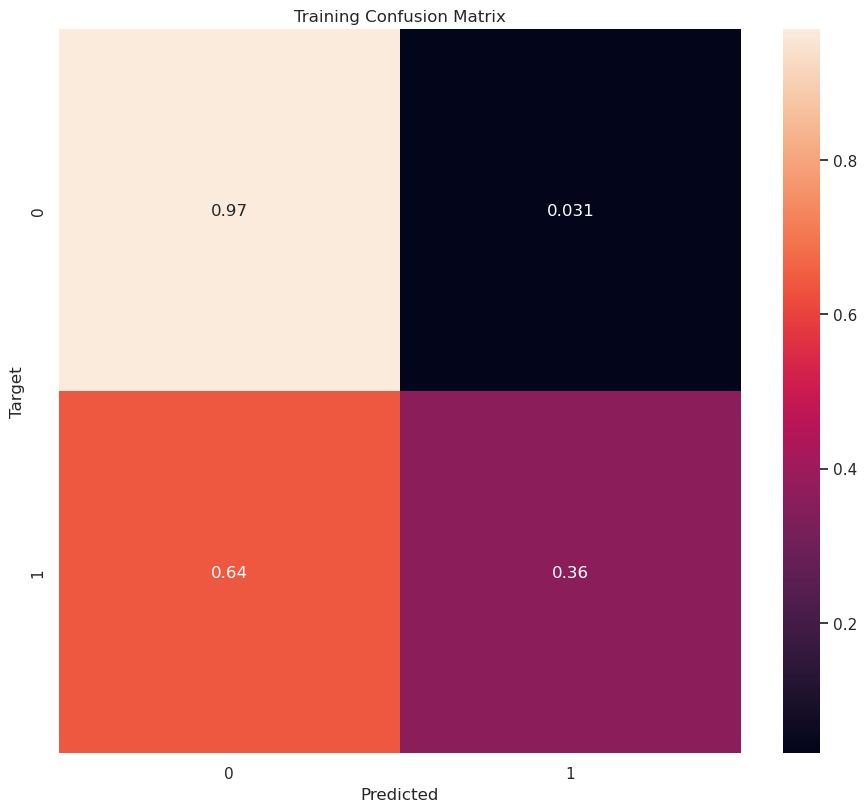

In [71]:
train_preds = predict_and_plot(X_train, train_target, 'Training')

Let's compute the model's accuracy on the validation and test sets too.



Accuracy: 87.03%


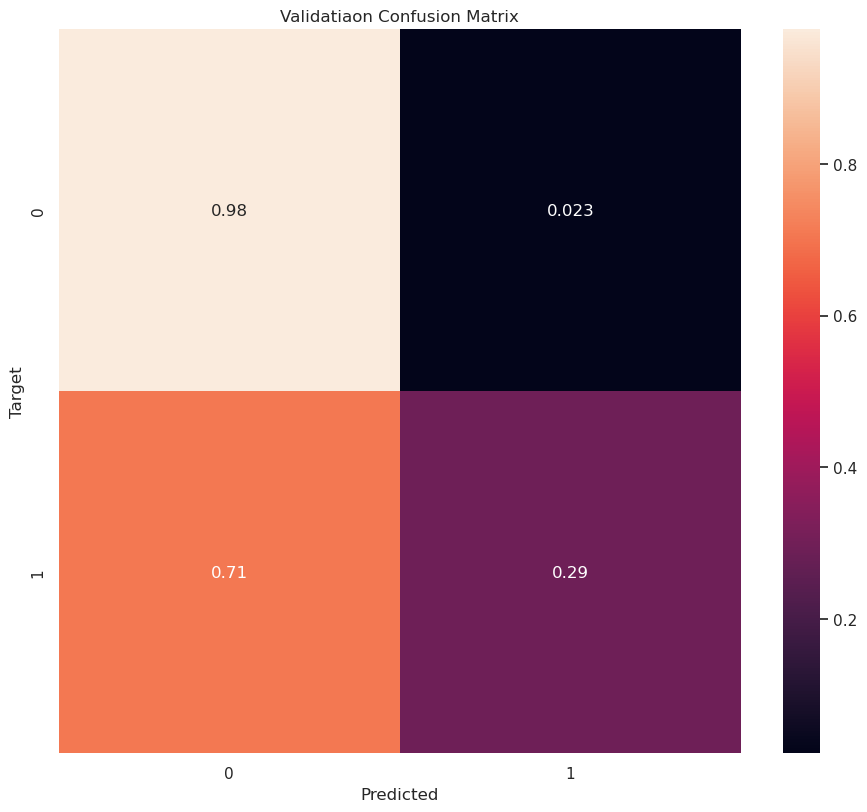

In [72]:
val_preds = predict_and_plot(X_val, val_target, 'Validatiaon')


Let's compute the model's accuracy on the validation and test sets too.



Accuracy: 86.17%


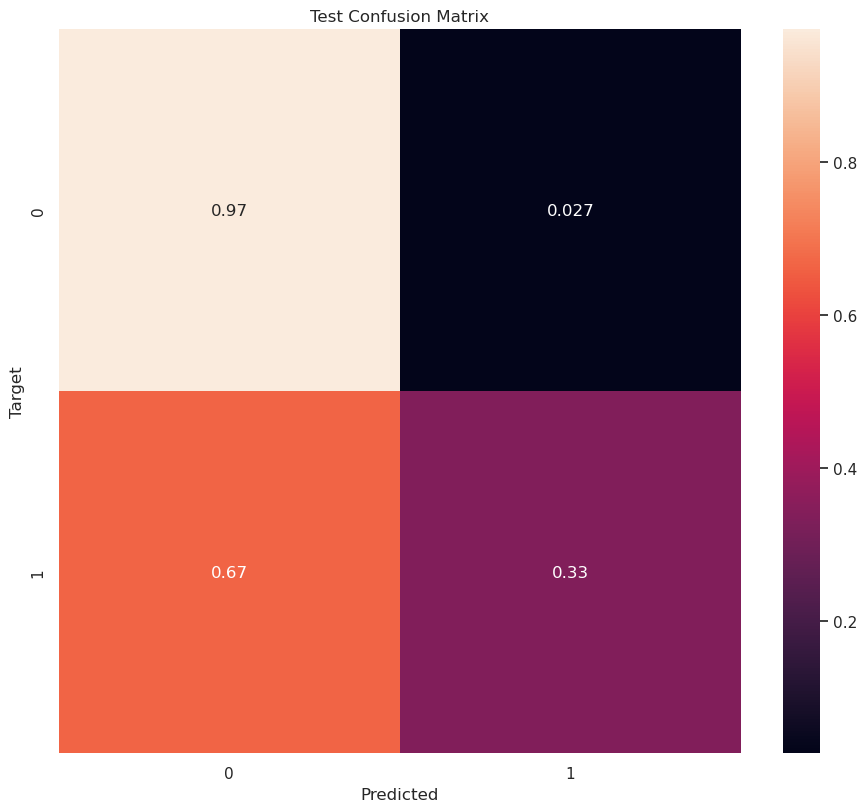

In [73]:
test_preds = predict_and_plot(X_test, test_target, 'Test')

The accuracy of the model on the test and validation set are above 84%, which suggests that our model generalizes well to data it hasn't seen before.

Let's create two models: one that guesses randomly and another that always return "No". Both of these models completely ignore the inputs given to them.

In [74]:
def random_guess(inputs):
    return np.random.choice(["No", "Yes"], len(inputs))

In [75]:
def all_no(inputs):
    return np.full(len(inputs), "No")

Let's check the accuracies of these two models on the test set.

In [76]:
accuracy_score(test_target, random_guess(X_test))

0.4994983948635634

In [77]:
accuracy_score(test_target, all_no(X_test))

0.8253912520064205

Our random model achieves an accuracy of 50% and our "always No" model achieves an accuracy of 82%. 

Thankfully, our model is better than a "dumb" or "random" model! This is not always the case, so it's a good practice to benchmark any model you train against such baseline models.